image.png


<h1><center><font size=10><a name='link6'>Data Science and Business Analytics</a></center></font></h1>


<h1><center> Practice Project 10 </center></h1>

<h1><center>Credit Score Classification EDA </center></h1>



<h1><center> By </center></h1>



<h1><center>Hayford Osumanu </center></h1>



<h1><center>March  2023 </center></h1>


image.png

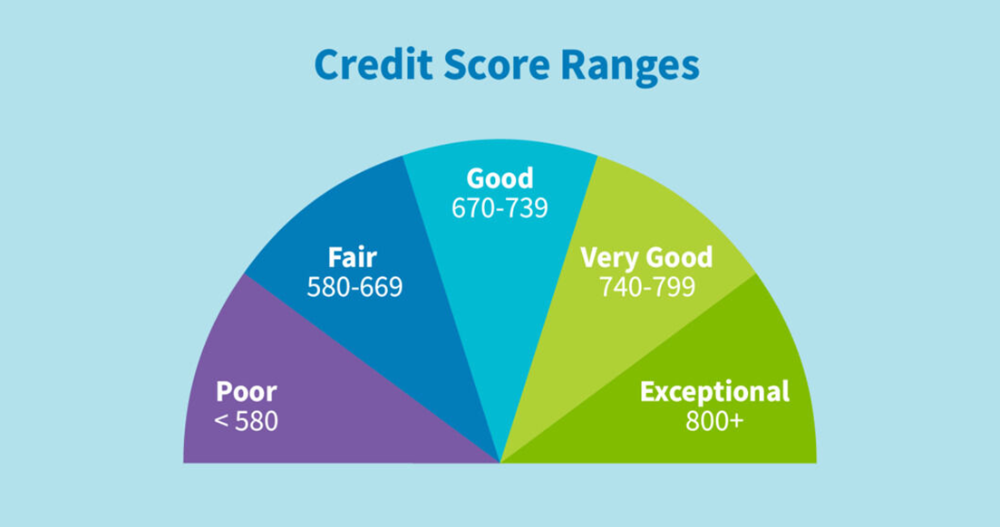

image.png

# <h1><left><font size=8><a name='link6'>Data Analysis Philosophy</a></center></font></h1>

In [ ]:
import this

The Zen of Python, by Tim Peters

Beautiful is better than ugly.
Explicit is better than implicit.
Simple is better than complex.
Complex is better than complicated.
Flat is better than nested.
Sparse is better than dense.
Readability counts.
Special cases aren't special enough to break the rules.
Although practicality beats purity.
Errors should never pass silently.
Unless explicitly silenced.
In the face of ambiguity, refuse the temptation to guess.
There should be one-- and preferably only one --obvious way to do it.
Although that way may not be obvious at first unless you're Dutch.
Now is better than never.
Although never is often better than *right* now.
If the implementation is hard to explain, it's a bad idea.
If the implementation is easy to explain, it may be a good idea.
Namespaces are one honking great idea -- let's do more of those!


image.png

# <h1><left><font size=8><a name='link6'>Importing Relevant Libraries</a></center></font></h1>

In [ ]:
# Other important packages for data data analysis
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from statsmodels.formula.api import ols
from statsmodels.graphics.gofplots import ProbPlot
import statsmodels.api as sm
from scipy import stats;

In [ ]:
#format numeric data for easier readability
pd.set_option(
    "display.float_format", lambda x: "%.2f" % x
)  # to display numbers rounded off to 2 decimal places

In [ ]:
# this will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns



# split the data into train and test
from sklearn.model_selection import train_test_split

# to build linear regression_model
from sklearn.linear_model import LinearRegression

# to check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# to build linear regression_model using statsmodels
import statsmodels.api as sm

# to compute VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# # Command to tell Python to actually display the graphs
%matplotlib inline
pd.set_option('display.float_format', lambda x: '%.2f' % x) # To supress numerical display in scientific notations

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200);


image.png

# <h1><left><font size=8><a name='link6'>Importing the Dataset into DataFrame</a></center></font></h1>

In [ ]:
# mounting  google drive to enable data reading
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Reading Dataset from Google Drive
Credit_data=pd.read_csv("/content/drive/MyDrive/290_Dataset/Credit_dataset.csv")

In [ ]:
# copying data to another variable to avoid any changes to original data
data = Credit_data.copy()

image.png

# <h1><left><font size=8><a name='link6'>Part I: Dataset Overview </a></center></font></h1>

### Observation of the DataFrame

The initial steps to get an overview of any dataset is to: 
- observe the first few rows of the dataset, to check whether the dataset has been loaded properly or not
- get information about the number of rows and columns in the dataset
- find out the data types of the columns to ensure that data is stored in the preferred format and the value of each property is as expected.
- check the statistical summary of the dataset to get an overview of the numerical columns of the data

In [ ]:
# Creating  a well readable header label
for header in data.columns:
    header_replace = header.replace(
        " ", "_"
    )  # creates new header with "_" instead of " ".
    data.rename(
        {header: header_replace}, axis=1, inplace=True
    )  # sets new header as header made in line above

image.png

In [ ]:
# Extracting the first 4 rows ofthe dataset
data.head(4)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,5634,3392,1,Aaron Maashoh,23.00,821000265.00,Scientist,19114.12,1824.84,3.00,4.00,3.00,4.00,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.00,7.00,11.27,4.00,Good,809.98,26.82,265.00,No,49.57,21.47,High_spent_Small_value_payments,312.49,Good
1,5635,3392,2,Aaron Maashoh,23.00,821000265.00,Scientist,19114.12,1824.84,3.00,4.00,3.00,4.00,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.00,4.00,11.27,4.00,Good,809.98,31.94,266.00,No,49.57,21.47,Low_spent_Large_value_payments,284.63,Good
2,5636,3392,3,Aaron Maashoh,23.00,821000265.00,Scientist,19114.12,1824.84,3.00,4.00,3.00,4.00,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.00,7.00,11.27,4.00,Good,809.98,28.61,267.00,No,49.57,21.47,Low_spent_Medium_value_payments,331.21,Good
3,5637,3392,4,Aaron Maashoh,23.00,821000265.00,Scientist,19114.12,1824.84,3.00,4.00,3.00,4.00,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5.00,4.00,6.27,4.00,Good,809.98,31.38,268.00,No,49.57,21.47,Low_spent_Small_value_payments,223.45,Good


image.png

### Columns/Variable/Features of the Dataset

In [ ]:
# Extracting the columns/variables of the dataset
data.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

The data in the tables above contains information of different attributes of  Customers based on their transaction history. The detailed data dictionary is given below.

image.png

### Dimension of the Dataset

In [ ]:
# checking the shape of the data
print(f"There are {data.shape[0]} rows and {data.shape[1]} columns.")

There are 100000 rows and 28 columns.


In [ ]:
# Checking the dimension (number of observations/rows and variables/columns of the Dataset (df.shape)
print("There are", data.shape[0], "rows and", data.shape[1], "columns.")

There are 100000 rows and 28 columns.


image.png

### Data Types of the Dataset

In [ ]:
# Checking the data types of the variables/columns for the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  float64
 5   SSN                       100000 non-null  float64
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              100000 non-null  ob

image.png

## Data Sanity Checks: Deep Checking/scrutinity of the the dataset before EDA

### Checking the Missing Values of the Dataset

In [ ]:
# Checking for missing values in the dataset
data.isnull().sum()

ID                          0
Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [ ]:
# Checking the total number of missing values in the dataset
data.isnull().sum().sum()

0

image.png

### Checking the Duplicates in the Dataset

In [ ]:
# let's check for duplicate values in the data
data.groupby(data.duplicated(subset=None, keep="first"), as_index=False).size()

,index,size
0,False,100000


In [ ]:
# checking for duplicate values
print("There are about", data.duplicated().sum(), "dupplicates in the dataset")

There are about 0 dupplicates in the dataset


image.png

### Checking the outliers of the dataset

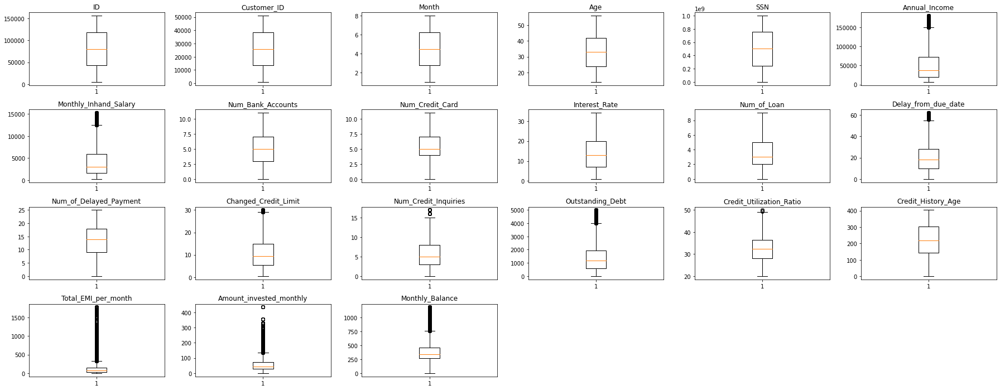

In [ ]:
# outlier detection using boxplot
import numpy as np

numeric_columns = data.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(25, 12))
for i, parameter in enumerate(numeric_columns):
    plt.subplot(5, 6, i + 1)
    plt.boxplot(data[parameter], whis=1.5)
    plt.tight_layout()
    plt.title(parameter)

plt.show()

image.png

### Overview of Categorical/Object Variables

In [ ]:
# Making a list of all catrgorical variables
cat_col = list(data.select_dtypes("object").columns)

# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    # print("cat_col")

Jessicad              48
Langep                48
Stevex                48
Vaughanl              40
Ronald Groverk        40
                      ..
Breidthardtj           8
Sven Egenterx          8
Antonella Ciancioc     8
Valentina Zan          8
Nicks                  8
Name: Name, Length: 10128, dtype: int64
Lawyer           7096
Engineer         6864
Architect        6824
Mechanic         6776
Scientist        6744
Accountant       6744
Developer        6720
Media_Manager    6720
Teacher          6672
Entrepreneur     6648
Doctor           6568
Journalist       6536
Manager          6432
Musician         6352
Writer           6304
Name: Occupation, dtype: int64
No Data                                                                                                                               11408
Not Specified                                                                                                                          1408
Credit-Builder Loan                         

#### Observation

- There are 3 categorical variables in the dataset

image.png

### Deleting Unnecessary Information/Columns before EDA

The columns Row_Number, Customer_Id, and Surname are related to personal data of the customers. These columns do not have any quantitative impact on any calculations whatsoever. Hence, we can avoid these extra columns of information by removing them from the data.

In [ ]:
# deleting the unnecessary columns (ID,CustomerId, Name and SSN)
data.drop(['ID', 'Customer_ID', 'Name','SSN'], axis=1, inplace=True)

In [ ]:
# sample of data after deleting the unnecessary columns
data.head(4)

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,1,23.00,Scientist,19114.12,1824.84,3.00,4.00,3.00,4.00,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.00,7.00,11.27,4.00,Good,809.98,26.82,265.00,No,49.57,21.47,High_spent_Small_value_payments,312.49,Good
1,2,23.00,Scientist,19114.12,1824.84,3.00,4.00,3.00,4.00,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.00,4.00,11.27,4.00,Good,809.98,31.94,266.00,No,49.57,21.47,Low_spent_Large_value_payments,284.63,Good
2,3,23.00,Scientist,19114.12,1824.84,3.00,4.00,3.00,4.00,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.00,7.00,11.27,4.00,Good,809.98,28.61,267.00,No,49.57,21.47,Low_spent_Medium_value_payments,331.21,Good
3,4,23.00,Scientist,19114.12,1824.84,3.00,4.00,3.00,4.00,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5.00,4.00,6.27,4.00,Good,809.98,31.38,268.00,No,49.57,21.47,Low_spent_Small_value_payments,223.45,Good


### Selecting numerical columns for further analysis

In [ ]:
# selecting numerical columns
num_col = data.select_dtypes(include=np.number).columns.tolist()

image.png

# <h1><left><font size=8><a name='link6'>Part II: Exploratory Data Analysis (EDA) </a></center></font></h1>

## Statistical Summary of the Dataset

### Descriptive Summary with Maximum observations

In [ ]:
# let's view the statistical summary of numerical columns in the data, max values highlighted
data.describe(include=np.number).T.style.highlight_max(color="indigo", axis=0)

,count,mean,std,min,25%,50%,75%,max
Month,100000.000000,4.500000,2.291299,1.000000,2.750000,4.500000,6.250000,8.000000
Age,100000.000000,33.316340,10.764812,14.000000,24.000000,33.000000,42.000000,56.000000
Annual_Income,100000.000000,50505.123449,38299.422093,7005.930000,19342.972500,36999.705000,71683.470000,179987.280000
Monthly_Inhand_Salary,100000.000000,4197.270835,3186.432497,303.645417,1626.594167,3095.905000,5957.715000,15204.633333
Num_Bank_Accounts,100000.000000,5.368820,2.593314,0.000000,3.000000,5.000000,7.000000,11.000000
Num_Credit_Card,100000.000000,5.533570,2.067098,0.000000,4.000000,5.000000,7.000000,11.000000
Interest_Rate,100000.000000,14.532080,8.741330,1.000000,7.000000,13.000000,20.000000,34.000000
Num_of_Loan,100000.000000,3.532880,2.446356,0.000000,2.000000,3.000000,5.000000,9.000000
Delay_from_due_date,100000.000000,21.081410,14.804560,0.000000,10.000000,18.000000,28.000000,62.000000
Num_of_Delayed_Payment,100000.000000,13.313120,6.237166,0.000000,9.000000,14.000000,18.000000,25.000000


image.png

### Quantiles Summary with Maximum observations

In [ ]:
# Extracting the Quantiles of the dataset max highlighted
data.quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T.style.highlight_max(
    color="purple", axis=0
)

,0.25,0.5,0.6,0.75,0.9,0.95,0.99
Month,2.750000,4.500000,5.000000,6.250000,8.000000,8.000000,8.000000
Age,24.000000,33.000000,36.000000,42.000000,48.000000,52.000000,55.000000
Annual_Income,19342.972500,36999.705000,48458.616000,71683.470000,108786.088000,130289.655000,166891.761200
Monthly_Inhand_Salary,1626.594167,3095.905000,4044.262500,5957.715000,9117.637500,10831.770000,13822.370000
Num_Bank_Accounts,3.000000,5.000000,6.000000,7.000000,9.000000,10.000000,10.000000
Num_Credit_Card,4.000000,5.000000,6.000000,7.000000,8.000000,9.000000,10.000000
Interest_Rate,7.000000,13.000000,16.000000,20.000000,28.000000,31.000000,34.000000
Num_of_Loan,2.000000,3.000000,4.000000,5.000000,7.000000,8.000000,9.000000
Delay_from_due_date,10.000000,18.000000,22.000000,28.000000,45.000000,54.000000,61.000000
Num_of_Delayed_Payment,9.000000,14.000000,16.000000,18.000000,21.000000,23.000000,25.000000


image.png

### Descriptive Summary of Categorical Variables

In [ ]:
# Summarize categorical features
data.describe(include=['object'])

,Occupation,Type_of_Loan,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
count,100000,100000,100000,100000,100000,100000
unique,15,6261,3,3,6,3
top,Lawyer,No Data,Standard,Yes,Low_spent_Small_value_payments,Standard
freq,7096,11408,45848,52326,28616,53174


image.png

### Observational Analysis

In [ ]:
# Select observations with maximum values in Pandas Dataframe
data.max().to_frame()

,0
Month,8
Age,56.00
Occupation,Writer
Annual_Income,179987.28
Monthly_Inhand_Salary,15204.63
Num_Bank_Accounts,11.00
Num_Credit_Card,11.00
Interest_Rate,34.00
Num_of_Loan,9.00
Type_of_Loan,"Student Loan, and Student Loan"


In [ ]:
# Select observations with minimum values in Pandas Dataframe
data.min().to_frame()

,0
Month,1
Age,14.00
Occupation,Accountant
Annual_Income,7005.93
Monthly_Inhand_Salary,303.65
Num_Bank_Accounts,0.00
Num_Credit_Card,0.00
Interest_Rate,1.00
Num_of_Loan,0.00
Type_of_Loan,Auto Loan


image.png

## Graphical Univariate Analysis

### Function to graphical analysis

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

image.png

### Bar Plot of Categorical Variables

In [ ]:
data1=data.copy()
# deleting the columns )
data1.drop(['Type_of_Loan'], axis=1, inplace=True)

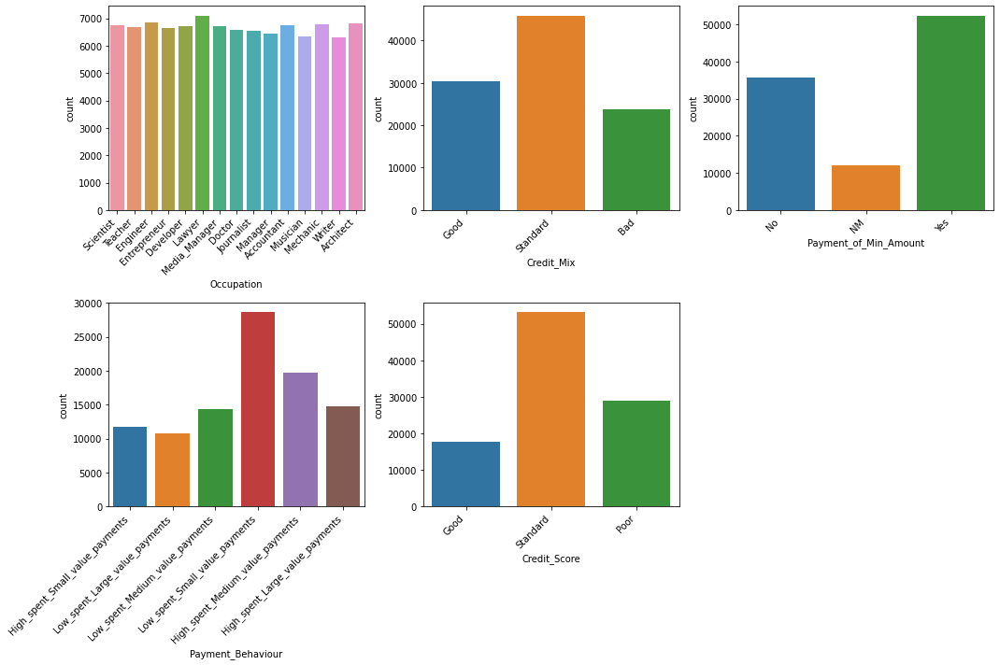

In [ ]:
# Checking the count plots of the categorical Variables
cols = 3
rows = 2
num_cols = data1.select_dtypes(include="object")
fig = plt.figure(figsize=(15, 10))

for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.countplot(x=data1[col], ax=ax)

    plt.xticks(rotation=45, ha="right")

fig.tight_layout()
plt.show()

image.png

### Histogram Plot of Numerical Variables

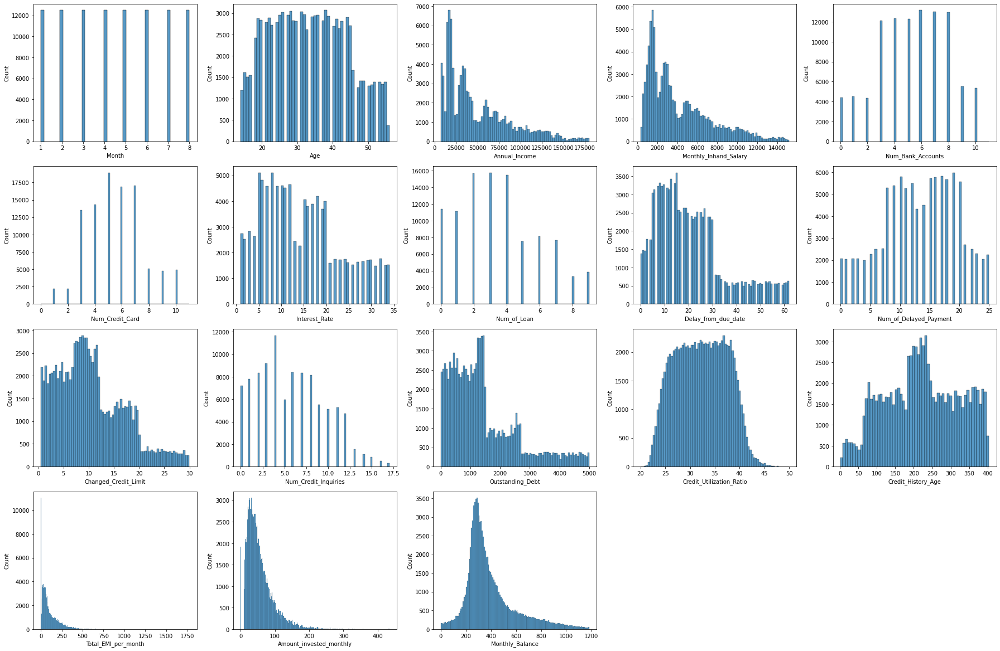

In [ ]:
# Checking the histogram plot of numerical variables of the entire dataset
cols = 5
rows = 6
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(cols * 5, rows * 4))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.histplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

image.png

### Density Plot of Numbericl Variables

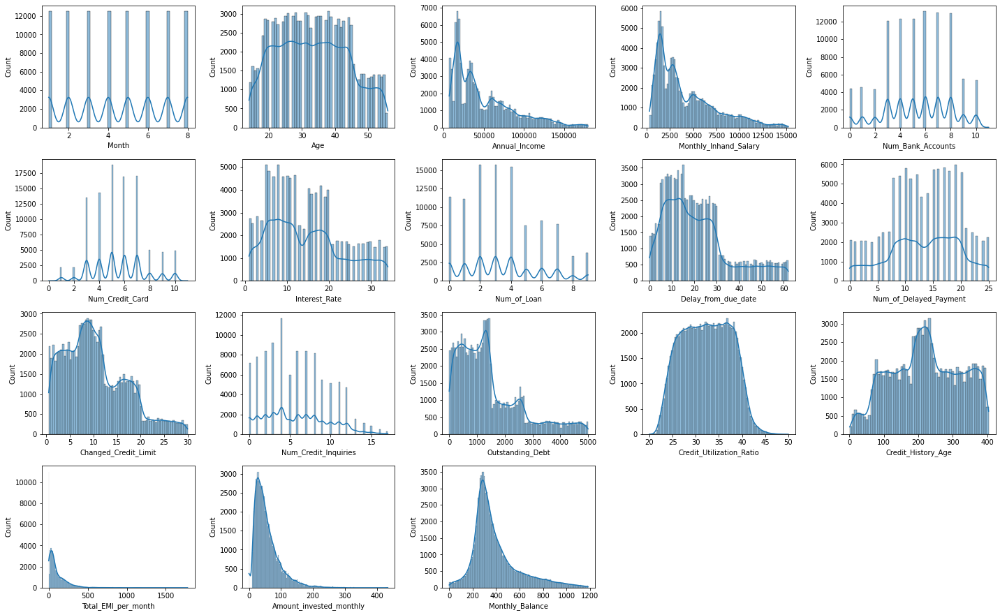

In [ ]:
# Checking the histogram plot of numerical variables of the entire dataset
cols = 5
rows = 6
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(cols * 4, rows * 3))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.histplot(x=data[col], kde=True, ax=ax)

fig.tight_layout()
plt.show()

image.png

### Box Plot of the Numerical Variables

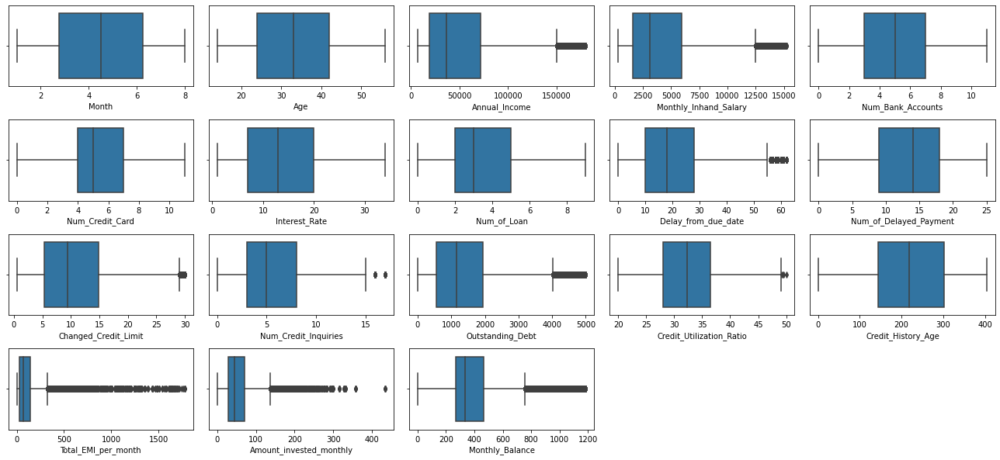

In [ ]:
# Checking the boxplot of the numerical variable of the dataset
cols = 5
rows = 6
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(18, 12))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.boxplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

image.png

### Violin Plot of Numerical Variables

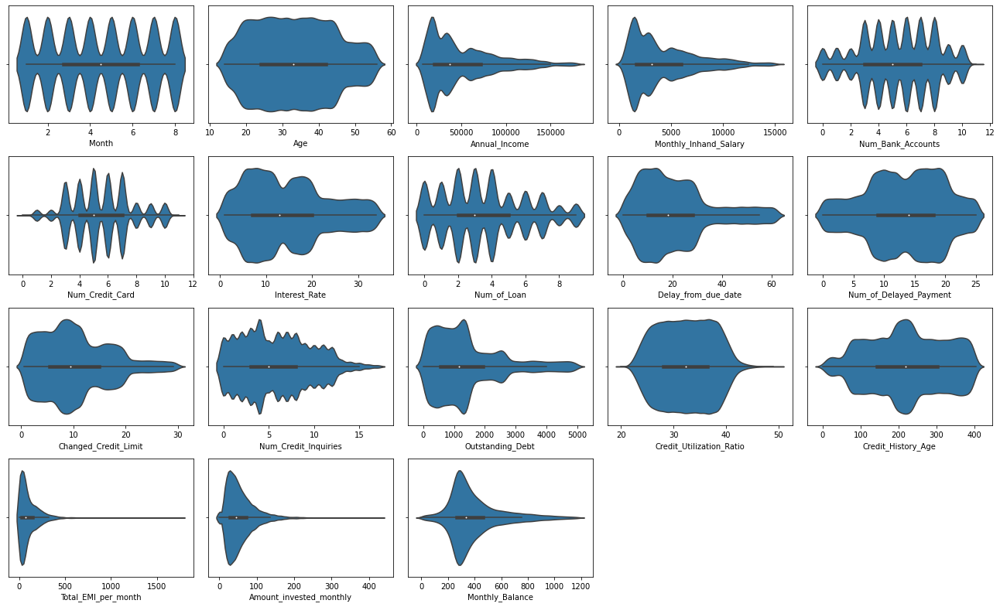

In [ ]:
# Checking the voilin plot of the numerical variables
cols = 5
rows = 6
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(18, 16))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.violinplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

image.png

## Multivariate Data Analysis

image.png

### The Kernel Density Estimate  Plot

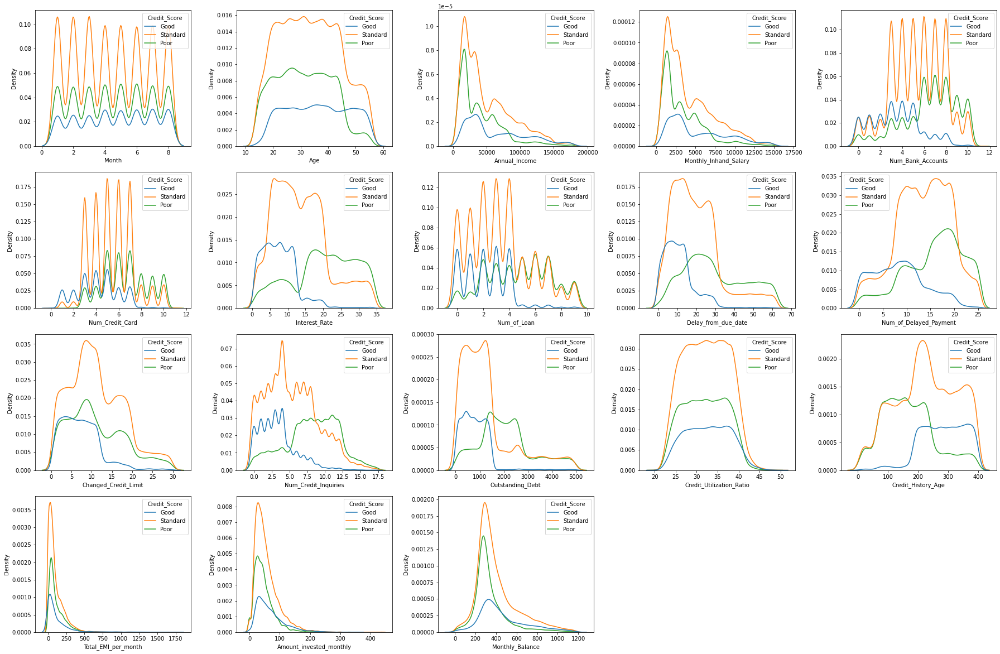

In [ ]:
# Checking the KDE plot of numerical variables of the entire dataset Vs Credit Score
cols = 5
rows = 6
num_cols = data.select_dtypes(exclude="object").columns
fig = plt.figure(figsize=(cols * 5, rows * 4))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.kdeplot(x=data[col], hue='Credit_Score',data=data)

fig.tight_layout()
plt.show()

image.png

### Correlation and Pairplot Analysis

In [ ]:
df=data.copy()

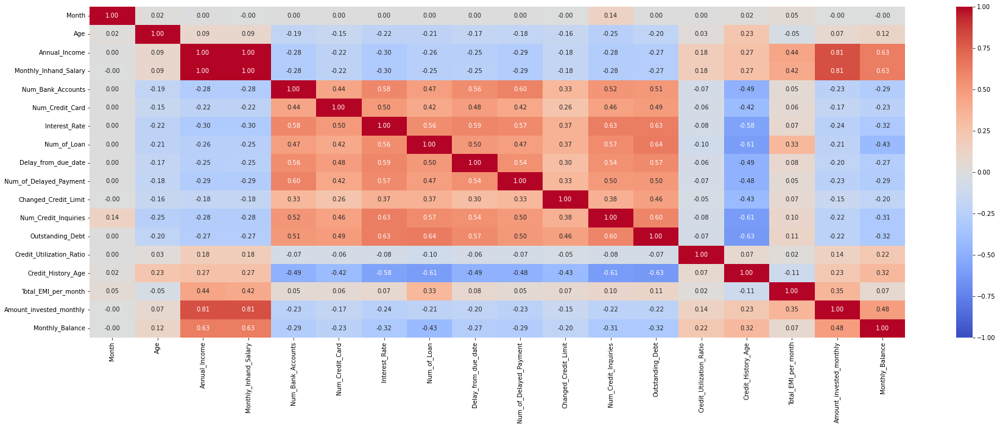

In [ ]:
# Displaying the correlation between numerical variables of the dataset
plt.figure(figsize=(30, 10))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="coolwarm")
plt.show()

image.png

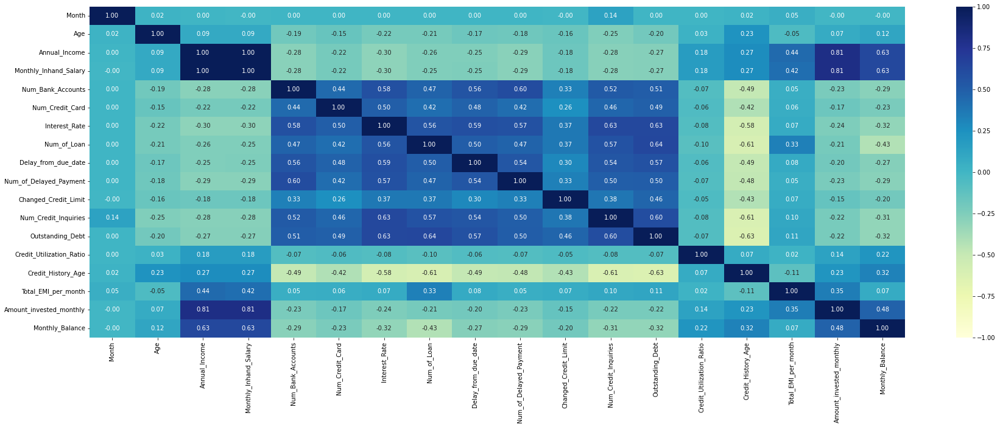

In [ ]:
# creates heatmap showing correlation of numeric columns in data
plt.figure(figsize=(30, 10))
sns.heatmap(df.corr(), vmin=-1, vmax=1, cmap="YlGnBu", annot=True, fmt=".2f");

image.png

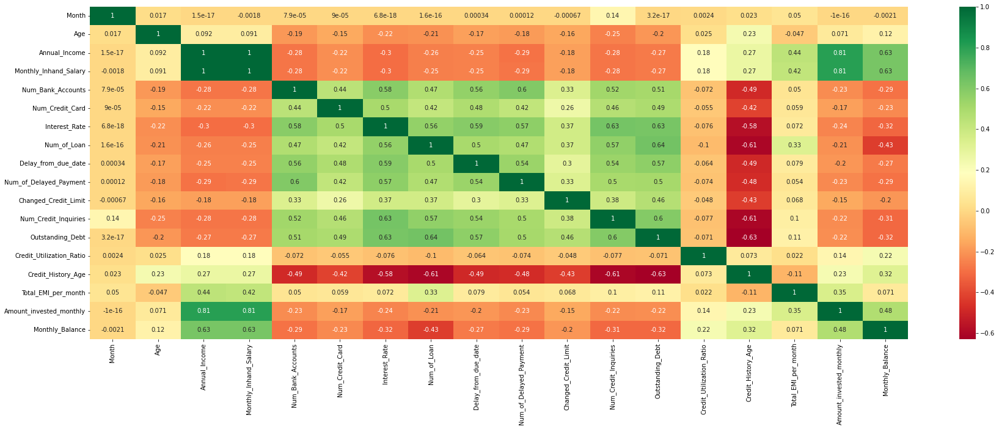

In [ ]:
# using heatmap
correlation = data.corr()  # creating a 2-D Matrix with correlation plots
plt.figure(figsize=(30, 10))
sns.heatmap(correlation, annot=True, cmap="RdYlGn");

image.png

In [ ]:
import plotly.express as px
fig = px.parallel_categories(data, color="Num_of_Loan", color_continuous_scale=px.colors.sequential.Inferno)
fig.show()

image.png

In [ ]:
# Sunburst of a rectangular DataFrame with discrete color argument in px.sunburst
import plotly.express as px
fig = px.sunburst(data, path=['Occupation',	'Credit_Mix',	'Payment_of_Min_Amount',	'Payment_Behaviour',	'Credit_Score'], values='Annual_Income', color='Credit_Score')
fig.show()

In [ ]:
import plotly.express as px
fig = px.sunburst(data, path=['Occupation',	'Credit_Mix',	'Payment_of_Min_Amount',	'Payment_Behaviour',	'Credit_Score'], values='Amount_invested_monthly', color='Credit_Score',
                  color_discrete_map={'(?)':'red', 'Lunch':'gold', 'Dinner':'green'})
fig.show()

image.png